Lección: Nicole Vera

In [ ]:

import pandas as pd
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.metrics.pairwise import pairwise_distances
import matplotlib.pyplot as plt
from sklearn.decomposition import LatentDirichletAllocation
import numpy as np


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
ruta_archivo = '/content/drive/MyDrive/datasets/data/drugsComTest_raw.tsv'
df = pd.read_csv(ruta_archivo, sep='\t')

In [ ]:
df

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,163740,Mirtazapine,Depression,"""I&#039;ve tried a few antidepressants over th...",10.0,"February 28, 2012",22
1,206473,Mesalamine,"Crohn's Disease, Maintenance","""My son has Crohn&#039;s disease and has done ...",8.0,"May 17, 2009",17
2,159672,Bactrim,Urinary Tract Infection,"""Quick reduction of symptoms""",9.0,"September 29, 2017",3
3,39293,Contrave,Weight Loss,"""Contrave combines drugs that were used for al...",9.0,"March 5, 2017",35
4,97768,Cyclafem 1 / 35,Birth Control,"""I have been on this birth control for one cyc...",9.0,"October 22, 2015",4
...,...,...,...,...,...,...,...
53761,159999,Tamoxifen,"Breast Cancer, Prevention","""I have taken Tamoxifen for 5 years. Side effe...",10.0,"September 13, 2014",43
53762,140714,Escitalopram,Anxiety,"""I&#039;ve been taking Lexapro (escitaploprgra...",9.0,"October 8, 2016",11
53763,130945,Levonorgestrel,Birth Control,"""I&#039;m married, 34 years old and I have no ...",8.0,"November 15, 2010",7
53764,47656,Tapentadol,Pain,"""I was prescribed Nucynta for severe neck/shou...",1.0,"November 28, 2011",20


In [ ]:
palabras_vacias = [linea.rstrip('\n') for linea in open('/content/drive/MyDrive/datasets/data/palabras_vacias.txt')]
len(palabras_vacias)

290

Aquí se procede a remover duplicados, simbolos especiales, etc.

In [ ]:
def remove_sw(t):
  tokens = t.strip().split(' ')
  tokens = [token for token in tokens if token not in palabras_vacias]
  tout = ' '.join(tokens).strip()
  return tout

def clean_text(t):
  t = str(t)
  t = re.sub(r'\d+',' ',t)
  t = re.sub(r'[^\w\n]',' ',t)
  t = re.sub(r'\s\s+',' ',t)
  t = t.lower()
  t = t.strip()
  return t

from wordcloud import WordCloud

def crear_nubes(col_cluster):
  gc = 2
  gr = int(nc/gc)
  wcwidth  = 1600
  wcheight = 800
  fig = plt.figure(figsize = (25,60))
  fig.suptitle('Análisis de clusters con {}'.format(col_cluster), fontsize=14)

  for i in range(nc):
    dfs = df[df[col_cluster] == i]['texto']
    texto = ' '.join(map(str,dfs.tolist()))
    wc = WordCloud(width=wcwidth, height=wcheight).generate(texto)
    ax = fig.add_subplot(gr,gc,i+1)
    ax.imshow(wc,interpolation='bilinear')
    ax.axis('off')
    ax.set_title('{} cluster # {}'.format(col_cluster,str(i+1)))
    ax.title.set_size(20)
  return fig

Se crea la matriz TF-IDF

In [ ]:
import numpy as np
df = df.replace('', np.NaN)
df = df[df['review'].notna()]
corpus = list(df['review'])
print(len(corpus))
corpus = [clean_text(t) for t in corpus]
corpus = [remove_sw(t) for t in corpus]
corpus

53766


['ve tried antidepressants years citalopram fluoxetine amitriptyline helped depression insomnia amp anxiety doctor suggested changed onto mg mirtazapine medicine has saved life thankfully effects especially most common weight gain ve actually lost alot weight suicidal thoughts mirtazapine has saved',
 'son has crohn disease has done asacol has complaints shows effects has taken nine tablets per day ve happy results reducing bouts diarrhea drastically',
 'quick reduction symptoms',
 'contrave combines drugs used alcohol smoking opioid cessation people lose weight helps control eating doubt most obesity caused sugar carb addiction powerful drug taking days news seems go immediately feel hungry food really care eat fill stomach since days ve lost weight scale clothes feel looser maybe pound or m hoping months medication develop healthier habits continue aid contrave',
 'birth control cycle reading reviews type similar birth controls bit apprehensive start im giving birth control enough fa

In [ ]:
vectorizer = TfidfVectorizer(stop_words='english',sublinear_tf=True)
X = vectorizer.fit_transform(corpus)
vocab = vectorizer.get_feature_names_out()
print(X.shape)

(53766, 30685)


In [ ]:
print(f" Registros de Noticias por Condicion")
df['condition'].value_counts()

 Registros de Noticias por Condicion


Birth Control                                  9648
Depression                                     3095
Pain                                           2100
Anxiety                                        1908
Acne                                           1847
                                               ... 
Gender Dysphoria                                  1
83</span> users found this comment helpful.       1
Meningococcal Meningitis Prophylaxis              1
Tympanostomy Tube Placement Surgery               1
Strongyloidiasis                                  1
Name: condition, Length: 708, dtype: int64

In [ ]:
nc = 14
df['texto'] = corpus
df.sample(n = 5)

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount,texto
21236,214812,Vicks Sinex Nasal Spray (old formulation),Nasal Congestion,"""I had severe congestion and pressure causing ...",9.0,"October 19, 2016",4,severe congestion pressure causing pain headac...
6760,84849,Ethinyl estradiol / norgestimate,Abnormal Uterine Bleeding,"""Do not try this, I had read the reviews b4 I ...",1.0,"March 31, 2016",1,read reviews b started felt uneasy taking revi...
14780,154006,Vivitrol,Opiate Dependence,"""First shot five days out of rehab, now on my ...",10.0,"February 23, 2015",59,shot days rehab fourth longest clean ve years ...
45360,19144,Pregabalin,ibromyalgia,"""It&#039;s sad when people write a drug of bec...",10.0,"May 13, 2017",56,sad people write drug their experience negativ...
29935,108308,Bupropion / naltrexone,Obesity,"""I have been on Contrave since April and have ...",10.0,"June 15, 2015",51,contrave since april lost lbs absolutely medic...


In [ ]:
lda_model = LatentDirichletAllocation(n_components=nc,random_state=10)
lda = lda_model.fit_transform(X)

In [ ]:
tp_palabra = {}
n_top_pal = 15
for topico, comp in enumerate(lda_model.components_):
  pal_ind = np.argsort(comp)[::-1][:n_top_pal]
  tp_palabra[topico] = [vocab[i] for i in pal_ind]

In [ ]:
for topico,palabras in tp_palabra.items():
  print("Tópico {} : {}".format(topico,' ,'.join(palabras)))

Tópico 0 : infection ,yeast ,urinary ,tract ,infections ,burning ,itching ,invokana ,vaginal ,uti ,monistat ,diflucan ,bactrim ,doryx ,estrace
Tópico 1 : asthma ,load ,inhaler ,viral ,cd ,cough ,undetectable ,allergies ,advair ,singulair ,allergy ,hiv ,symbicort ,rescue ,copd
Tópico 2 : expensive ,fast ,diovan ,okay ,lasix ,vl ,makena ,herpes ,poison ,uc ,ivy ,ok ,anal ,arimidex ,hemorrhoids
Tópico 3 : mg ,anxiety ,depression ,feel ,life ,taking ,sleep ,effects ,years ,medication ,day ,like ,medicine ,started ,panic
Tópico 4 : smoking ,chantix ,quit ,smoke ,smoked ,excellent ,years ,smoker ,cigarette ,worked ,cigarettes ,pack ,dreams ,free ,day
Tópico 5 : pain ,day ,taking ,mg ,effects ,years ,medicine ,medication ,days ,doctor ,took ,severe ,hours ,prescribed ,like
Tópico 6 : lost ,lbs ,weight ,pounds ,eat ,started ,effects ,blood ,taking ,week ,day ,weeks ,pressure ,eating ,ve
Tópico 7 : silenor ,cancer ,harvoni ,previfem ,pradaxa ,hep ,blisovi ,camrese ,expensive ,prenatal ,coumadin

In [ ]:
topicos = []
for n in range(lda.shape[0]):
  topicos.append(lda[n].argmax())
df['lda'] = topicos

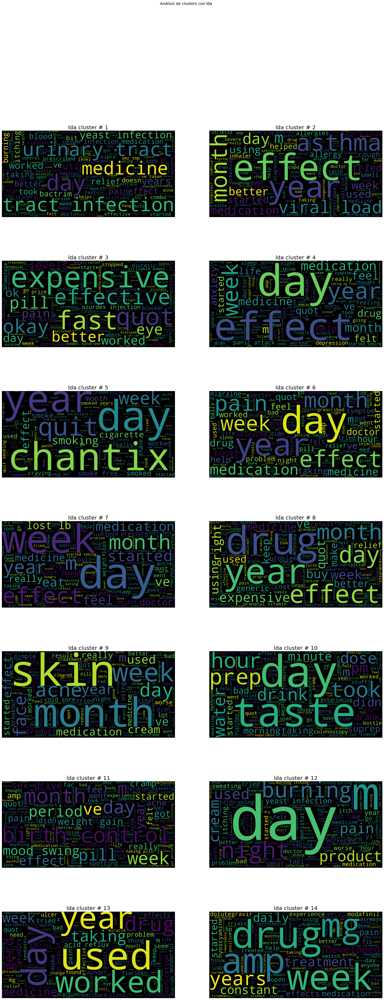

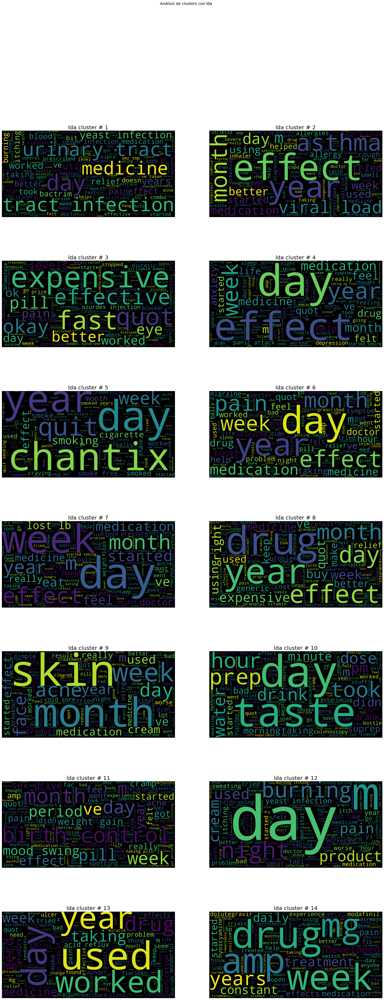

In [ ]:
crear_nubes('lda')

Se procede a crear topicos con NMF

In [ ]:
from sklearn.decomposition import NMF

In [ ]:
nmf_model = NMF(n_components=nc,random_state=10,max_iter=400)
nmf = nmf_model.fit_transform(X)

/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


In [ ]:
tp_palabras = {}
for topico, comp in enumerate(nmf_model.components_):
  pal_ind = np.argsort(comp)[::-1][:n_top_pal]
  tp_palabras[topico] = [vocab[i] for i in pal_ind]

In [ ]:
for topico,palabras in tp_palabra.items():
  print("Tópico {} : {}".format(topico,' ,'.join(palabras)))

Tópico 0 : infection ,yeast ,urinary ,tract ,infections ,burning ,itching ,invokana ,vaginal ,uti ,monistat ,diflucan ,bactrim ,doryx ,estrace
Tópico 1 : asthma ,load ,inhaler ,viral ,cd ,cough ,undetectable ,allergies ,advair ,singulair ,allergy ,hiv ,symbicort ,rescue ,copd
Tópico 2 : expensive ,fast ,diovan ,okay ,lasix ,vl ,makena ,herpes ,poison ,uc ,ivy ,ok ,anal ,arimidex ,hemorrhoids
Tópico 3 : mg ,anxiety ,depression ,feel ,life ,taking ,sleep ,effects ,years ,medication ,day ,like ,medicine ,started ,panic
Tópico 4 : smoking ,chantix ,quit ,smoke ,smoked ,excellent ,years ,smoker ,cigarette ,worked ,cigarettes ,pack ,dreams ,free ,day
Tópico 5 : pain ,day ,taking ,mg ,effects ,years ,medicine ,medication ,days ,doctor ,took ,severe ,hours ,prescribed ,like
Tópico 6 : lost ,lbs ,weight ,pounds ,eat ,started ,effects ,blood ,taking ,week ,day ,weeks ,pressure ,eating ,ve
Tópico 7 : silenor ,cancer ,harvoni ,previfem ,pradaxa ,hep ,blisovi ,camrese ,expensive ,prenatal ,coumadin

In [ ]:
topicos = []
for n in range(nmf.shape[0]):
  topicos.append(nmf[n].argmax())
df['nmf'] = topicos

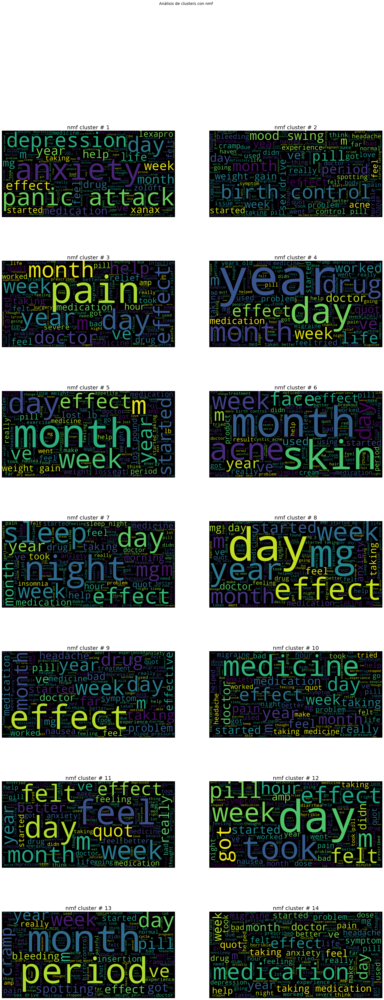

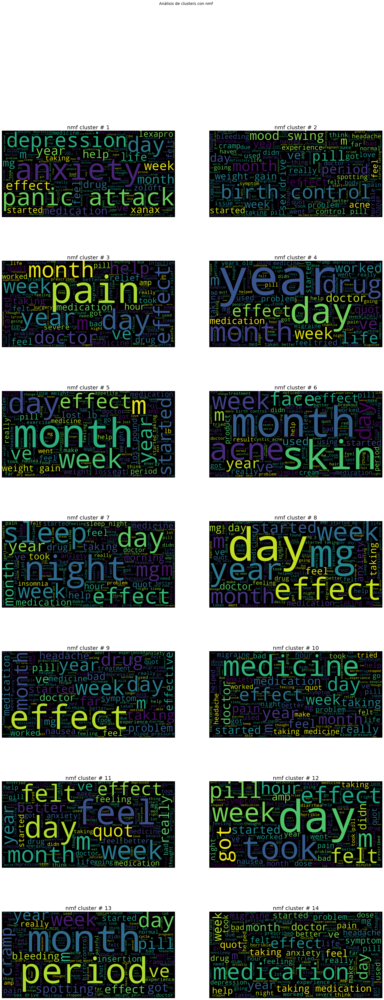

In [ ]:
crear_nubes('nmf')